## Libraries

In [2]:
import pandas as pd
import numpy as np
import os
import json
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from scipy.stats import linregress


# Load data from JSON files into DataFrames
def load_json_to_df(filename):
    """
    Load data from a JSON file and return as a DataFrame.

    Parameters:
    filename (str): Path to the JSON file.

    Returns:
    pd.DataFrame: DataFrame containing data from the JSON file.
    """
    with open(filename, "r") as file:
        data = json.load(file)
    return pd.DataFrame(data)


def load_all_json_files(directory):
    """
    Loads all JSON files in a specified directory into pandas DataFrames, storing each
    DataFrame in a dictionary with keys derived from the file names.

    Parameters:
    directory (str): The directory from which to load JSON files.

    Returns:
    dict: A dictionary containing DataFrames. Keys are the file names without the '.json' extension.
    """
    data_frames = {}
    for filename in os.listdir(directory):
        if filename.endswith(".json"):
            file_path = os.path.join(directory, filename)
            data = load_json_to_df(file_path)
            # Use the file name without '.json' as the key
            key_name = filename[
                :-5
            ]  # Removes the last 5 characters, which should be ".json"
            data_frames[key_name] = pd.DataFrame(data)
    return data_frames

## Load data

In [3]:
# Load the TSV file into a DataFrame
all_probes_results_df = pd.read_csv(
    "../data_exports/forced_alignments_and_analysis_results_dataframe.tsv", sep="\t"
)

all_high_VL_samples_alignment_info_df = pd.read_csv(
    "../data_exports/initial_BLAST_alignments_dataframe_all_high_VL_samples_alignment_info_df.tsv",
    sep="\t",
)

# Plotting

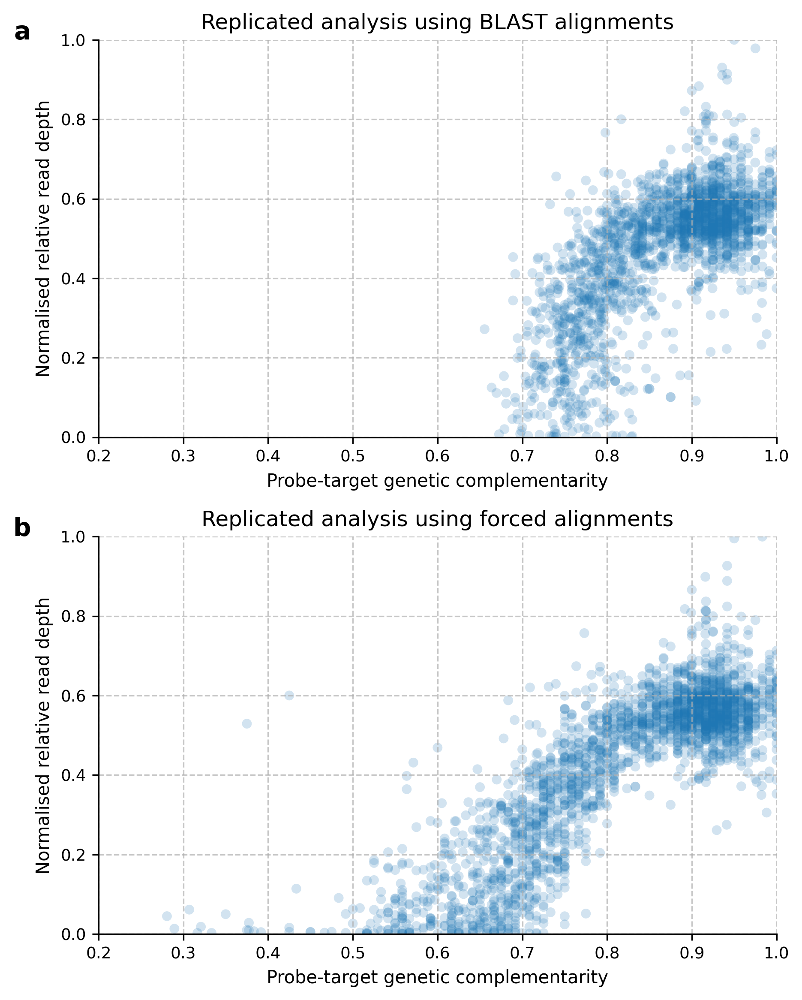

In [4]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create a figure with two subplots, one below the other
fig, axs = plt.subplots(
    2,
    1,
    figsize=(16 * centimeters, 20 * centimeters),
    sharex=False,
    sharey=True,
    dpi=300,
)

# Plotting Normalized ratio of coverages for HiSeq assemblies
axs[0].grid(True, linestyle="--", alpha=0.7)
axs[0].scatter(
    all_high_VL_samples_alignment_info_df["num_sims_per_base_hiseq"],
    all_high_VL_samples_alignment_info_df["normalized_coverage"],
    color="C0",
    alpha=0.2,
    edgecolors="None",
    s=30,
)
axs[0].set_xlabel("Probe-target genetic complementarity")
axs[0].set_ylabel("Normalised relative read depth")
axs[0].set_ylim([0, 1])
axs[0].set_xlim([0.2, 1])
axs[0].spines["top"].set_visible(False)
axs[0].spines["right"].set_visible(False)
axs[0].set_title("Replicated analysis using BLAST alignments")
axs[0].text(
    -0.1,
    1.05,
    "a",
    transform=axs[0].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Plotting Normalized ratio of coverages for MSA
axs[1].grid(True, linestyle="--", alpha=0.7)
axs[1].scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    color="C0",
    alpha=0.2,
    edgecolors="None",
    s=30,
)
axs[1].set_xlabel("Probe-target genetic complementarity")
axs[1].set_ylabel("Normalised relative read depth")
axs[1].set_ylim([0, 1])
axs[1].set_xlim([0.2, 1])
axs[1].spines["top"].set_visible(False)
axs[1].spines["right"].set_visible(False)
axs[1].set_title("Replicated analysis using forced alignments")
axs[1].text(
    -0.1,
    1.05,
    "b",
    transform=axs[1].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

### Comparison with results from Bonsall et al. 2015

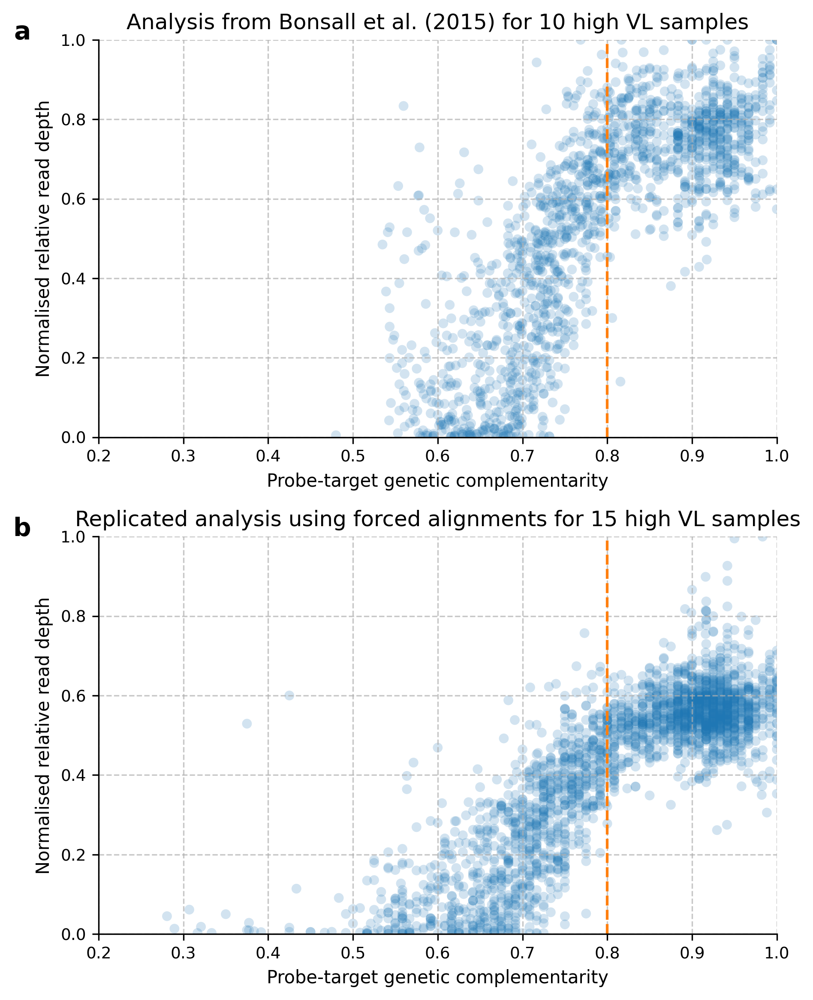

In [6]:
# Load data for Azim's analysis
summary_tables_path = "../my_matlab_scripts_and_exports/summary_tables_json_files"
Capture_efficiency_coverage_ref_path = (
    "../my_matlab_scripts_and_exports/Capture_efficiency_coverage_ref"
)

summary_tables = load_all_json_files(summary_tables_path)
Capture_efficiency_coverage_ref = load_all_json_files(
    Capture_efficiency_coverage_ref_path
)

# Extract necessary data for Azim's analysis
normalised_cov_azim = Capture_efficiency_coverage_ref["normalised_cov"]
num_sims_per_base_ass_azim = Capture_efficiency_coverage_ref["num_sims_per_base_ass"]

# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create a figure with two subplots, one below the other
fig, axs = plt.subplots(
    2,
    1,
    figsize=(16 * centimeters, 20 * centimeters),
    sharex=False,
    sharey=True,
    dpi=300,
)

# Plotting Normalized ratio of coverages for Azim's analysis
axs[0].grid(True, linestyle="--", alpha=0.7)
for index, row in normalised_cov_azim.iterrows():
    if index < 10:  # Plot only the first 10 samples
        max_idx = np.argmax(row)
        nn = row / row[max_idx]  # Normalize by max value in the row
        axs[0].scatter(
            num_sims_per_base_ass_azim.iloc[index],
            nn,
            color="C0",
            alpha=0.2,
            edgecolors="none",
            s=30,
        )
axs[0].set_xlabel("Probe-target genetic complementarity")
axs[0].set_ylabel("Normalised relative read depth")
axs[0].set_ylim([0, 1])
axs[0].set_xlim([0.2, 1])
axs[0].axvline(x=0.8, color="C1", linestyle="--", label="Threshold at 0.8")
axs[0].spines["top"].set_visible(False)
axs[0].spines["right"].set_visible(False)
axs[0].set_title("Analysis from Bonsall et al. (2015) for 10 high VL samples")
axs[0].text(
    -0.1,
    1.05,
    "a",
    transform=axs[0].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Plotting Normalized ratio of coverages for MSA
axs[1].grid(True, linestyle="--", alpha=0.7)
axs[1].scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    color="C0",
    alpha=0.2,
    edgecolors="None",
    s=30,
)
axs[1].set_xlabel("Probe-target genetic complementarity")
axs[1].set_ylabel("Normalised relative read depth")
axs[1].set_ylim([0, 1])
axs[1].set_xlim([0.2, 1])
axs[1].axvline(x=0.8, color="C1", linestyle="--", label="Threshold at 0.8")
axs[1].spines["top"].set_visible(False)
axs[1].spines["right"].set_visible(False)
axs[1].set_title("Replicated analysis using forced alignments for 15 high VL samples")
axs[1].text(
    -0.1,
    1.05,
    "b",
    transform=axs[1].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

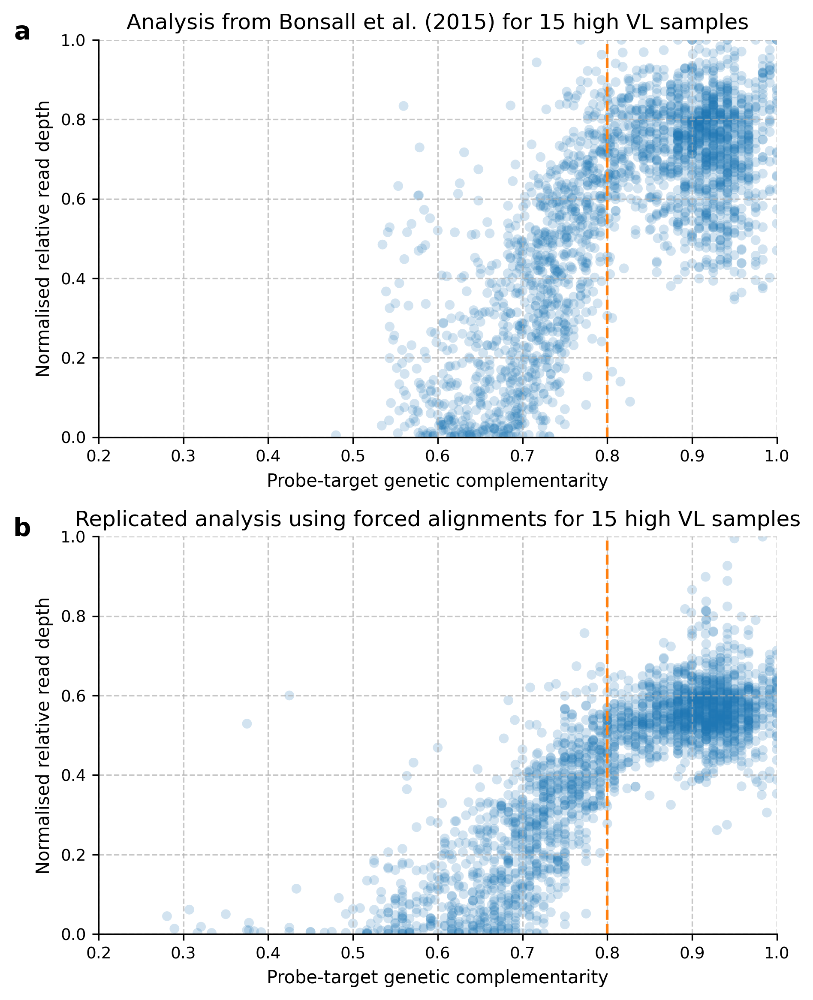

In [8]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create a figure with two subplots, one below the other
fig, axs = plt.subplots(
    2,
    1,
    figsize=(16 * centimeters, 20 * centimeters),
    sharex=False,
    sharey=True,
    dpi=300,
)

# Plotting Normalized ratio of coverages for Azim's analysis
axs[0].grid(True, linestyle="--", alpha=0.7)
for index, row in normalised_cov_azim.iterrows():
    if index < 15:  # Plot the first 15 samples
        max_idx = np.argmax(row)
        nn = row / row[max_idx]  # Normalize by max value in the row
        axs[0].scatter(
            num_sims_per_base_ass_azim.iloc[index],
            nn,
            color="C0",
            alpha=0.2,
            edgecolors="none",
            s=30,
        )
axs[0].set_xlabel("Probe-target genetic complementarity")
axs[0].set_ylabel("Normalised relative read depth")
axs[0].set_ylim([0, 1])
axs[0].set_xlim([0.2, 1])
axs[0].axvline(x=0.8, color="C1", linestyle="--", label="Threshold at 0.8")
axs[0].spines["top"].set_visible(False)
axs[0].spines["right"].set_visible(False)
axs[0].set_title("Analysis from Bonsall et al. (2015) for 15 high VL samples")
axs[0].text(
    -0.1,
    1.05,
    "a",
    transform=axs[0].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Plotting Normalized ratio of coverages for MSA
axs[1].grid(True, linestyle="--", alpha=0.7)
axs[1].scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    color="C0",
    alpha=0.2,
    edgecolors="None",
    s=30,
)
axs[1].set_xlabel("Probe-target genetic complementarity")
axs[1].set_ylabel("Normalised relative read depth")
axs[1].set_ylim([0, 1])
axs[1].set_xlim([0.2, 1])
axs[1].axvline(x=0.8, color="C1", linestyle="--", label="Threshold at 0.8")
axs[1].spines["top"].set_visible(False)
axs[1].spines["right"].set_visible(False)
axs[1].set_title("Replicated analysis using forced alignments for 15 high VL samples")
axs[1].text(
    -0.1,
    1.05,
    "b",
    transform=axs[1].transAxes,
    fontsize=14,
    fontweight="bold",
    va="top",
    ha="right",
)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## Plotting capture efficiency
### Normalisation across all samples

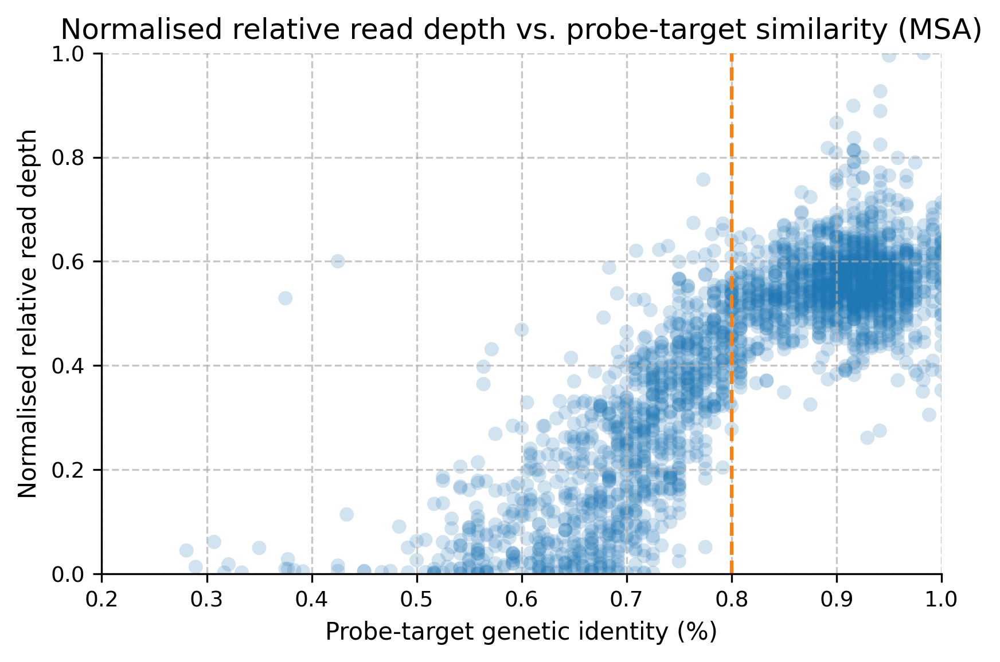

In [6]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

figsize_half_page_a4_portrait = (16 * centimeters, 12.35 * centimeters)
figsize_full_page_a4_portrait = (16 * centimeters, 24.7 * centimeters)
figsize_half_page_a4_landscape = (12.35 * centimeters, 16 * centimeters)
figsize_full_page_a4_landscape = (24.7 * centimeters, 16 * centimeters)

# Plotting Normalized ratio of coverages for MSA
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)
plt.scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    color="C0",
    alpha=0.2,
    edgecolors="None",
)
plt.xlabel("Probe-target genetic identity (%)")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([0.2, 1])
plt.axvline(x=0.8, color="C1", linestyle="--", label="Threshold at 0.8")
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title("Normalised relative read depth vs. probe-target similarity (MSA)")
plt.show()

### Plotting samples individually

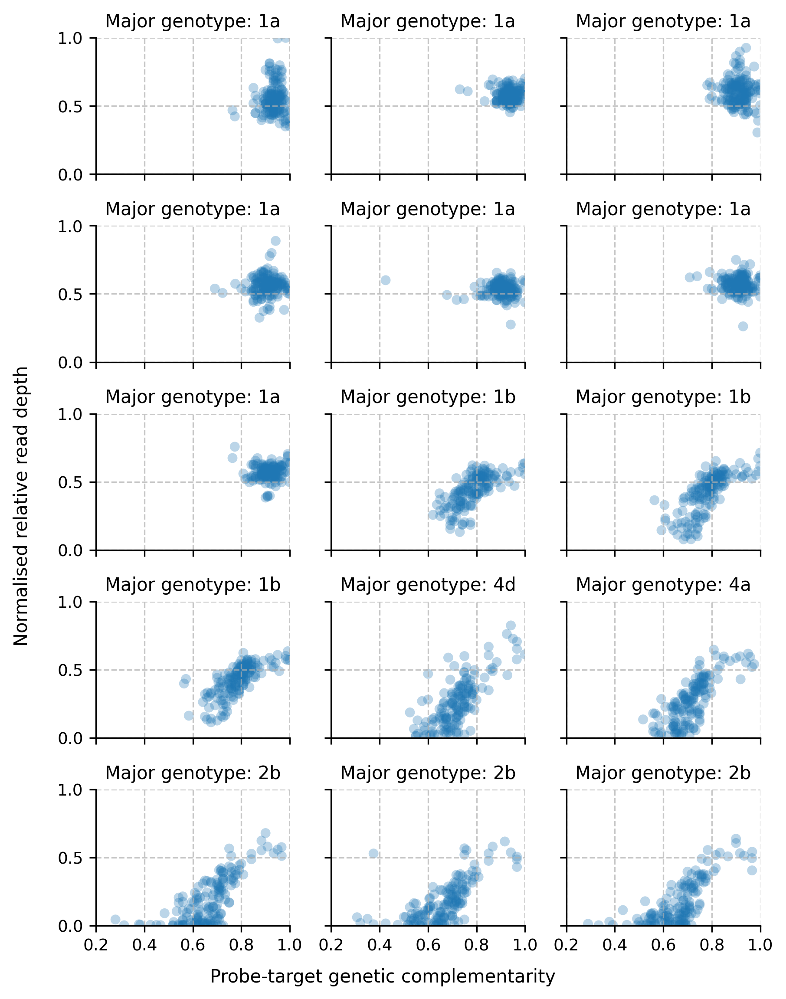

In [7]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14


def plot_samples_individually(df, n_rows=5, n_cols=3):
    # Get unique run_ids
    unique_run_ids = df["run_id"].unique()[: n_rows * n_cols]

    # Set up the plot
    fig, axs = plt.subplots(
        n_rows,
        n_cols,
        figsize=(16 * centimeters, 20 * centimeters),
        dpi=300,
        sharex=True,
        sharey=True,
    )

    # Flatten axs
    axs = axs.flatten()

    for i, run_id in enumerate(unique_run_ids):
        sample_df = df[df["run_id"] == run_id]
        # Get the q50_major_type for this run_id
        q50_major_type = sample_df["q50_major_type"].iloc[0]
        ax = axs[i]
        ax.grid(True, linestyle="--", alpha=0.7)
        ax.scatter(
            sample_df["genetic_distance"],
            sample_df["normalized_coverage"],
            color="C0",
            alpha=0.3,
            edgecolors="None",
            s=30,
        )
        ax.set_title(f"Major genotype: {q50_major_type}", fontsize=10)
        ax.set_xlim([0.2, 1])
        ax.set_ylim([0, 1])
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        # Remove x and y tick labels for all subplots
        ax.set_xticklabels([])
        ax.set_yticklabels([])

    # Remove any unused subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    # Add common x and y labels
    fig.text(
        0.5, 0.04, "Probe-target genetic complementarity", ha="center", va="center"
    )
    fig.text(
        0.06,
        0.5,
        "Normalised relative read depth",
        ha="center",
        va="center",
        rotation="vertical",
    )

    # Add x and y tick labels only to the bottom-left subplot
    bottom_left_ax = axs[n_cols * (n_rows - 1)]

    # Set fewer fixed ticks for x-axis
    x_ticks = np.array([0.2, 0.4, 0.6, 0.8, 1])
    bottom_left_ax.set_xticks(x_ticks)
    bottom_left_ax.set_xticklabels([f"{x:.1f}" for x in x_ticks])

    # Set fewer fixed ticks for y-axis
    y_ticks = np.array([0, 0.5, 1])
    bottom_left_ax.set_yticks(y_ticks)
    bottom_left_ax.set_yticklabels([f"{y:.1f}" for y in y_ticks])

    plt.tight_layout()
    # Adjust layout to make room for common labels
    plt.subplots_adjust(left=0.15, bottom=0.09)
    plt.show()


# Usage:
plot_samples_individually(all_probes_results_df)

## GC content analysis

### Plotting for simple GC content calculation

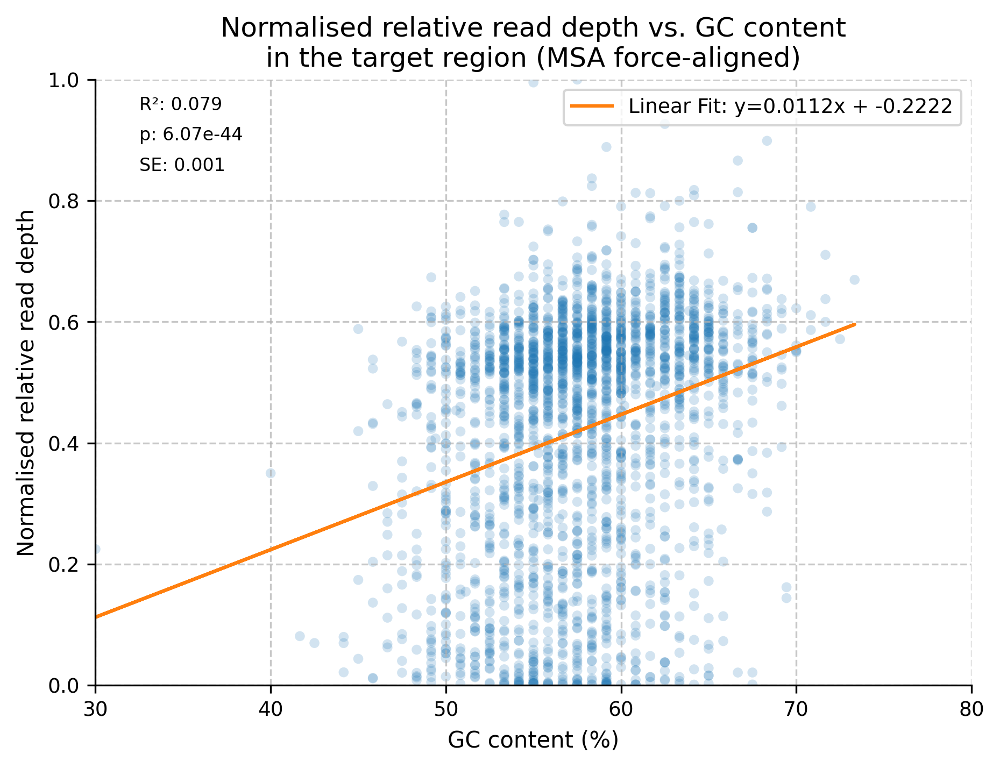

In [8]:
# Set global font sizes
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

# Define figure size
centimeters = 1 / 2.54  # centimeters in inches

# Extract the data for the plot
x = all_probes_results_df["gc_alignment_region"]
y = all_probes_results_df["normalized_coverage"]

# Compute the linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Create the scatter plot
plt.figure(figsize=figsize_half_page_a4_portrait, dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)
plt.scatter(x, y, color="C0", alpha=0.2, edgecolors="None", s=20)

# Plot the linear fit line
plt.plot(
    x,
    intercept + slope * x,
    color="C1",
    label=f"Linear Fit: y={slope:.4f}x + {intercept:.4f}",
)

# Add R-squared, p-value, and standard error to the plot
plt.text(0.05, 0.95, f"R²: {r_value**2:.3f}", transform=plt.gca().transAxes, fontsize=8)
plt.text(0.05, 0.90, f"p: {p_value:.2e}", transform=plt.gca().transAxes, fontsize=8)
plt.text(0.05, 0.85, f"SE: {std_err:.3f}", transform=plt.gca().transAxes, fontsize=8)

# Plot configurations
plt.xlabel("GC content (%)")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([30, 80])
plt.legend(loc="upper right")

# Despine the top and right axes
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.title(
    "Normalised relative read depth vs. GC content\nin the target region (MSA force-aligned)"
)

plt.tight_layout()
plt.show()

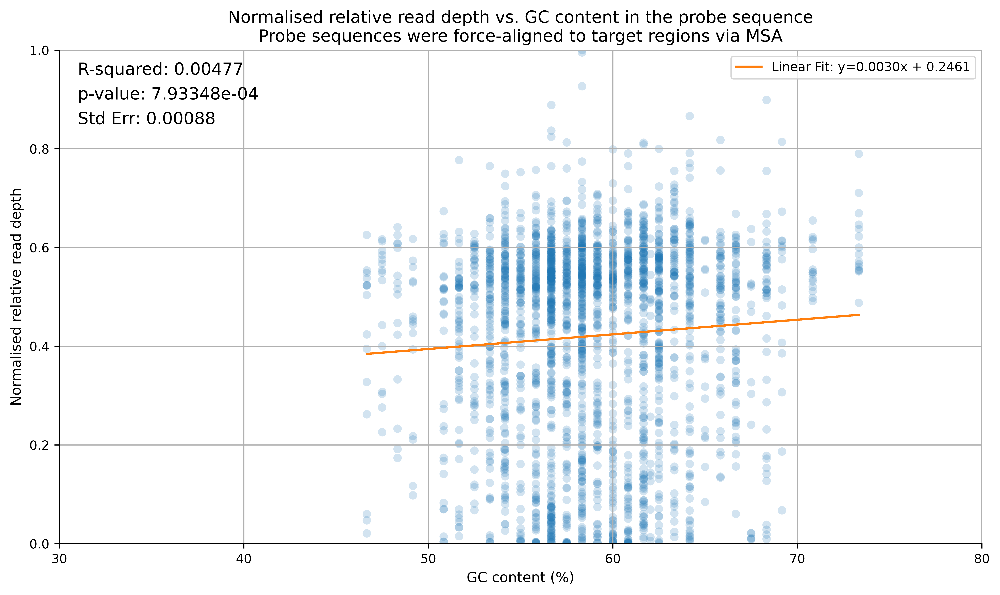

In [9]:
# Extract the data for the plot
x = all_probes_results_df["gc_probe_sequence"]
y = all_probes_results_df["normalized_coverage"]

# Compute the linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Create the scatter plot
plt.figure(figsize=(10, 6), dpi=600)
plt.grid(True)
plt.scatter(x, y, color="C0", alpha=0.2, edgecolors="None")

# Plot the linear fit line
plt.plot(
    x,
    intercept + slope * x,
    color="C1",
    label=f"Linear Fit: y={slope:.4f}x + {intercept:.4f}",
)

# Add R-squared, p-value, and standard error to the plot
plt.text(31, 0.95, f"R-squared: {r_value**2:.5f}", fontsize=12, color="black")
plt.text(31, 0.9, f"p-value: {p_value:.5e}", fontsize=12, color="black")
plt.text(31, 0.85, f"Std Err: {std_err:.5f}", fontsize=12, color="black")

# Plot configurations
plt.xlabel("GC content (%)")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([30, 80])
plt.legend()
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title(
    "Normalised relative read depth vs. GC content in the probe sequence\nProbe sequences were force-aligned to target regions via MSA"
)
plt.tight_layout()
plt.show()

### Plotting complementary GC content calculation

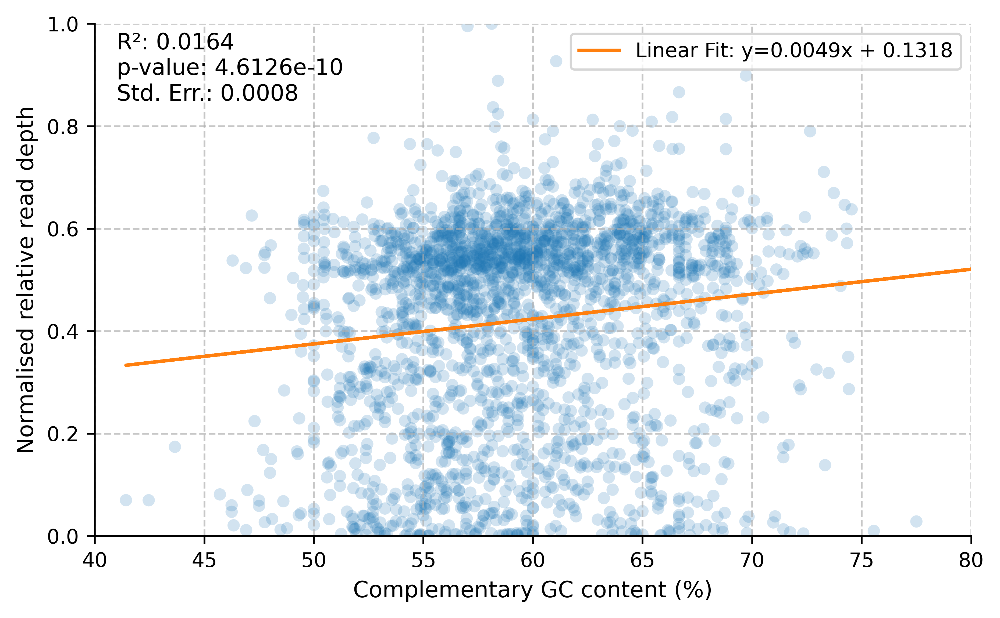

In [10]:
# Set global font sizes
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Extract the data for the plot
x = all_probes_results_df["gc_complementary"]
y = all_probes_results_df["normalized_coverage"]

# Compute the linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Create the scatter plot
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=600)
plt.grid(True, linestyle="--", alpha=0.7)
plt.scatter(x, y, color="C0", alpha=0.2, edgecolors="None", s=30)

# Plot the linear fit line
plt.plot(
    x,
    intercept + slope * x,
    color="C1",
    label=f"Linear Fit: y={slope:.4f}x + {intercept:.4f}",
)

# Add R-squared, p-value, and standard error to the plot
plt.text(41, 0.95, f"R²: {r_value**2:.4f}", fontsize=10, color="black")
plt.text(41, 0.90, f"p-value: {p_value:.4e}", fontsize=10, color="black")
plt.text(41, 0.85, f"Std. Err.: {std_err:.4f}", fontsize=10, color="black")

# Plot configurations
plt.xlabel("Complementary GC content (%)")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([40, 80])
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### GC content data points coloured

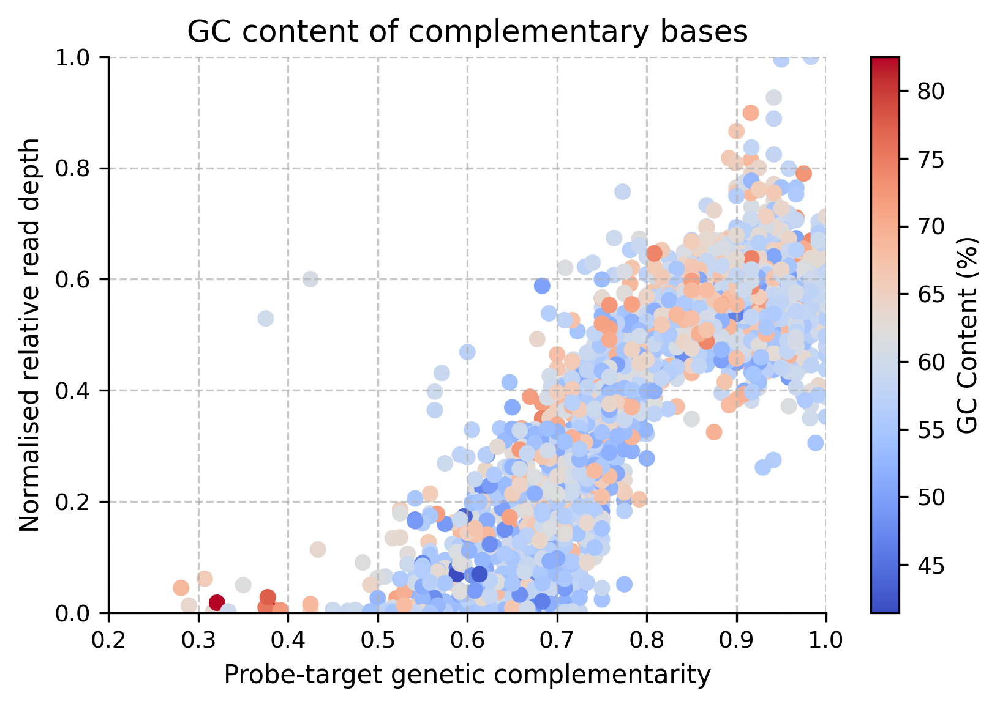

In [11]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create the plot with data points colored by their GC content
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)

# Normalize the gc_hiseq values to the range [0, 1] for color mapping
norm = mcolors.Normalize(
    vmin=all_probes_results_df["gc_complementary"].min(),
    vmax=all_probes_results_df["gc_complementary"].max(),
)
centimetersap = cm.ScalarMappable(norm=norm, cmap="coolwarm")

# Create a scatter plot
sc = plt.scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    c=all_probes_results_df["gc_complementary"],
    cmap="coolwarm",
    alpha=1,
    s=30,
)

# Add color bar
cbar = plt.colorbar(sc)
cbar.set_label("GC Content (%)")

# Plot configurations
plt.xlabel("Probe-target genetic complementarity")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([0.2, 1])
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title("GC content of complementary bases")
plt.show()

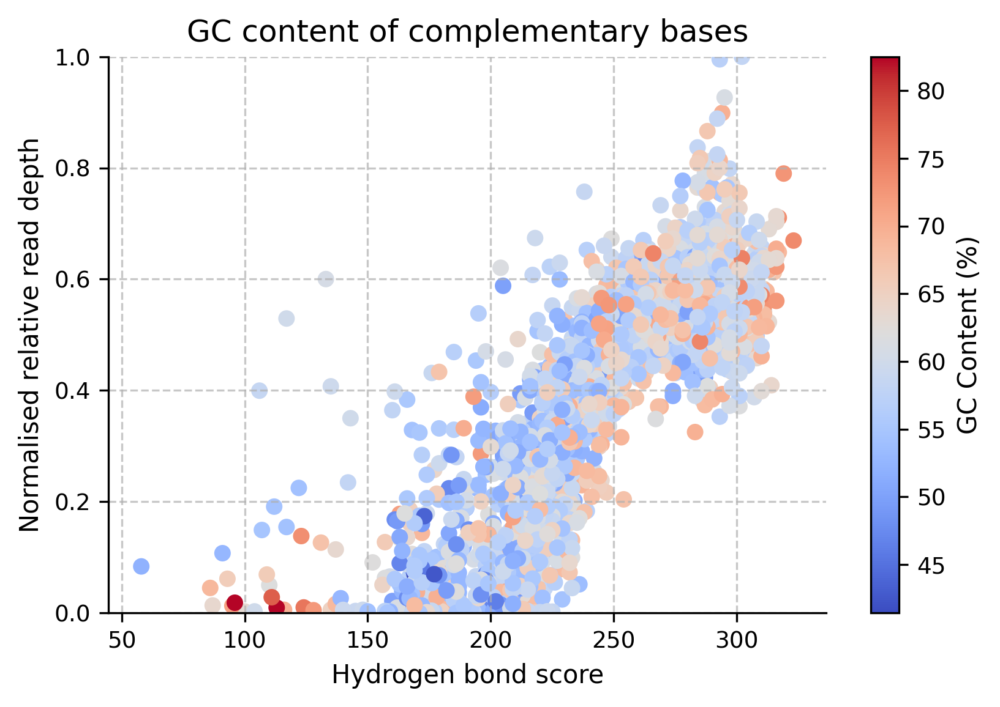

In [13]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create the plot with data points colored by their GC content
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)

# Normalize the gc_hiseq values to the range [0, 1] for color mapping
norm = mcolors.Normalize(
    vmin=all_probes_results_df["gc_complementary"].min(),
    vmax=all_probes_results_df["gc_complementary"].max(),
)
centimetersap = cm.ScalarMappable(norm=norm, cmap="coolwarm")

# Create a scatter plot
sc = plt.scatter(
    all_probes_results_df["hydrogen_bond_score"],
    all_probes_results_df["normalized_coverage"],
    c=all_probes_results_df["gc_complementary"],
    cmap="coolwarm",
    alpha=1,
    s=30,
)

# Add color bar
cbar = plt.colorbar(sc)
cbar.set_label("GC Content (%)")

# Plot configurations
plt.xlabel("Hydrogen bond score")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title("GC content of complementary bases")
plt.show()

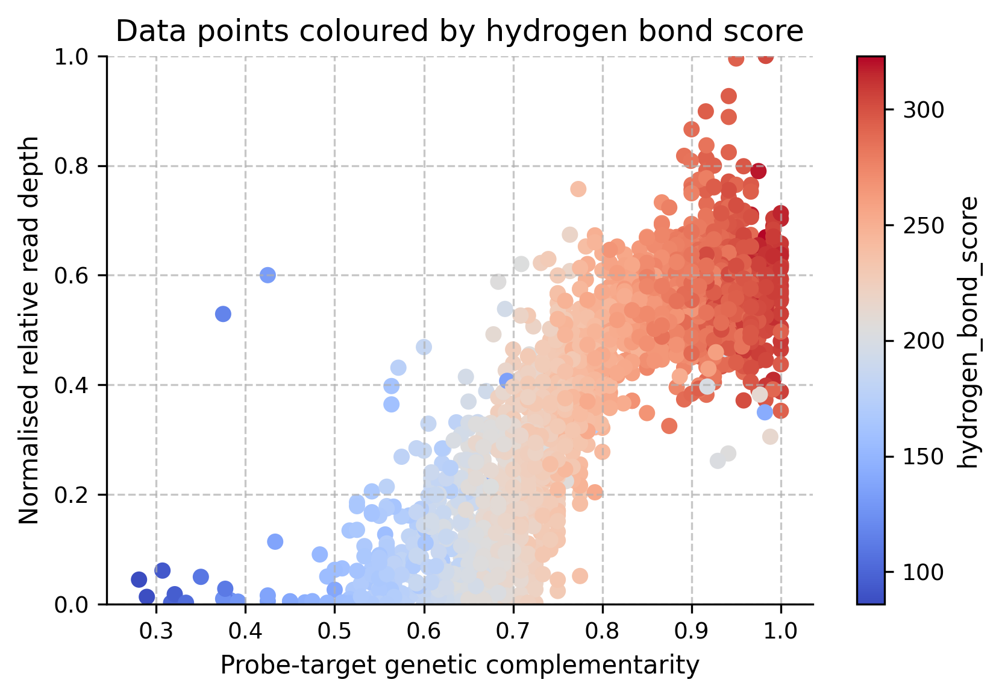

In [16]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

centimeters = 1 / 2.54  # centimeters in inches

# Create the plot with data points colored by their GC content
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)

# Normalize the gc_hiseq values to the range [0, 1] for color mapping
norm = mcolors.Normalize(
    vmin=all_probes_results_df["hydrogen_bond_score"].min(),
    vmax=all_probes_results_df["hydrogen_bond_score"].max(),
)
centimetersap = cm.ScalarMappable(norm=norm, cmap="coolwarm")

# Create a scatter plot
sc = plt.scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    c=all_probes_results_df["hydrogen_bond_score"],
    cmap="coolwarm",
    alpha=1,
    s=30,
)

# Add color bar
cbar = plt.colorbar(sc)
cbar.set_label("hydrogen_bond_score")

# Plot configurations
plt.xlabel("Probe-target genetic complementarity")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title("Data points coloured by hydrogen bond score")
plt.show()

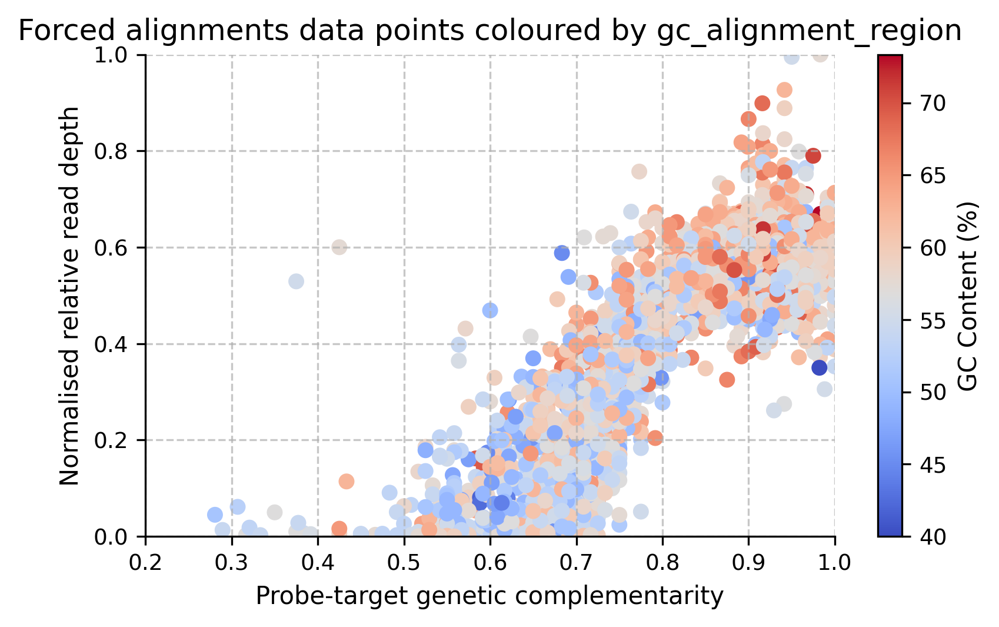

In [12]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

# Create the plot with data points colored by their GC content
plt.figure(figsize=(16 * centimeters, 9 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)

# Normalize the gc_hiseq values to the range [0, 1] for color mapping
norm = mcolors.Normalize(
    vmin=all_probes_results_df["gc_alignment_region"].min(),
    vmax=all_probes_results_df["gc_alignment_region"].max(),
)
cmap = cm.ScalarMappable(norm=norm, cmap="coolwarm")

# Create a scatter plot
sc = plt.scatter(
    all_probes_results_df["genetic_distance"],
    all_probes_results_df["normalized_coverage"],
    c=all_probes_results_df["gc_alignment_region"],
    cmap="coolwarm",
    alpha=1,
    s=30,
)

# Add color bar
cbar = plt.colorbar(sc)
cbar.set_label("GC Content (%)")

# Plot configurations
plt.xlabel("Probe-target genetic complementarity")
plt.ylabel("Normalised relative read depth")
plt.ylim([0, 1])
plt.xlim([0.2, 1])
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title("Forced alignments data points coloured by gc_alignment_region")
plt.show()

## Hydrogen bond score for forced alignments

### Plotting hydrogen bond score without any line fitted

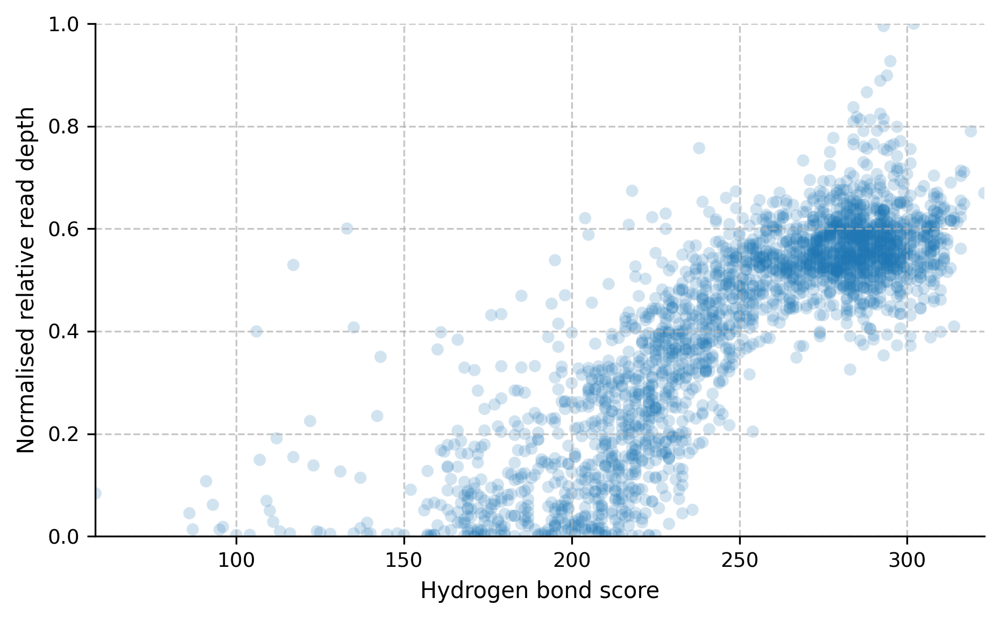

In [23]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14

# load data for plotting
x = all_probes_results_df["hydrogen_bond_score"]
y = all_probes_results_df["normalized_coverage"]

# Filter out rows with any "N" characters in base_reference_alignment_region because the hydrogen bond scores for that will be skewed
N_THRESHOLD = 1
filtered_df = all_probes_results_df[
    (all_probes_results_df["num_n_characters"] <= N_THRESHOLD)
    & (
        all_probes_results_df["probe_sequence"].apply(len)
        == all_probes_results_df["base_reference_alignment_region"].apply(len)
    )
]

# Create the plot
plt.figure(figsize=(16 * centimeters, 10 * centimeters), dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)
plt.scatter(x, y, color="C0", alpha=0.2, edgecolors="None", s=30)
plt.xlabel("Hydrogen bond score")
plt.ylabel("Normalised relative read depth")
plt.xlim(min(x), max(x))
plt.ylim(0, 1)
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
plt.show()

### Plotting hydrogen bond score for forced alignments with fitted line

Original p-value: 0.0
Missing values in x: 0
Missing values in y: 0
Infinite values in x: 0
Infinite values in y: 0
Subset p-value: 3.046077649281745e-293


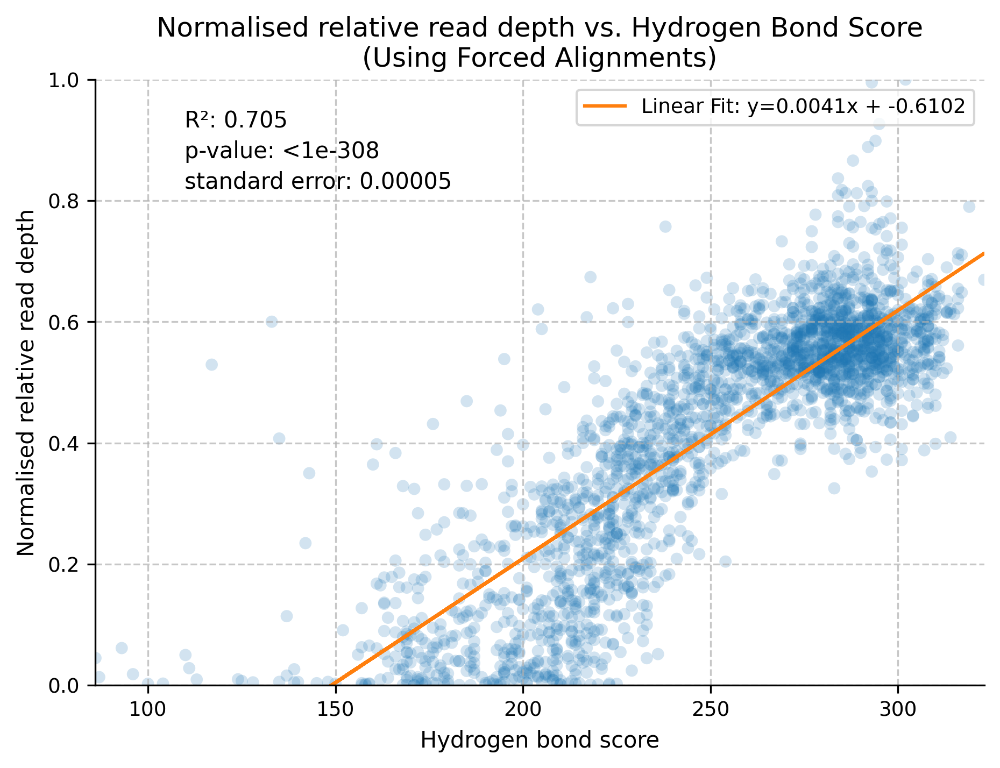

In [14]:
# Set global font sizes for consistency across all figures
rcParams["font.size"] = 10
rcParams["axes.titlesize"] = 12
rcParams["axes.labelsize"] = 10
rcParams["xtick.labelsize"] = 9
rcParams["ytick.labelsize"] = 9
rcParams["legend.fontsize"] = 9
rcParams["figure.titlesize"] = 14


# load data for plotting
x = all_probes_results_df["hydrogen_bond_score"]
y = all_probes_results_df["normalized_coverage"]

# Filter out rows with any "N" characters in base_reference_alignment_region because the hydrogen bond scores for that will be skewed
N_THRESHOLD = 1
filtered_df = all_probes_results_df[
    (all_probes_results_df["num_n_characters"] <= N_THRESHOLD)
    & (
        all_probes_results_df["probe_sequence"].apply(len)
        == all_probes_results_df["base_reference_alignment_region"].apply(len)
    )
]

x = filtered_df["hydrogen_bond_score"]
y = filtered_df["normalized_coverage"]

# Compute the linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Print the p-value to check its exact value
print(
    f"Original p-value: {p_value}"
)  # this returns 0 which is likely a bug because the value is so tiny

# Check for missing or infinite values to understand why p-value is 0
print(f"Missing values in x: {x.isnull().sum()}")
print(f"Missing values in y: {y.isnull().sum()}")
print(f"Infinite values in x: {np.isinf(x).sum()}")
print(f"Infinite values in y: {np.isinf(y).sum()}")

# Take a subset of the data that is 50% as large as the original dataset
x_subset = x.sample(frac=0.5, random_state=1)
y_subset = y.loc[x_subset.index]

# Compute the linear regression on the subset
slope_subset, intercept_subset, r_value_subset, p_value_subset, std_err_subset = (
    linregress(x_subset, y_subset)
)

print(
    f"Subset p-value: {p_value_subset}"
)  # this returns a valid tiny number, so the earlier p-value of 0 was just a bug because the value is so small

# Create the plot
plt.figure(figsize=figsize_half_page_a4_portrait, dpi=300)
plt.grid(True, linestyle="--", alpha=0.7)
plt.scatter(x, y, color="C0", alpha=0.2, edgecolors="None", s=30)
plt.plot(
    x,
    intercept + slope * x,
    color="C1",
    label=f"Linear Fit: y={slope:.4f}x + {intercept:.4f}",
)

# Handle extremely small p-value
formatted_p_value = "<1e-308" if p_value == 0 else f"{p_value:.2e}"

# Add statistics to the plot
plt.text(
    0.1,
    0.95,
    f"R²: {r_value**2:.3f}",
    transform=plt.gca().transAxes,
    va="top",
)
plt.text(
    0.1,
    0.90,
    f"p-value: {formatted_p_value}",
    transform=plt.gca().transAxes,
    va="top",
)
plt.text(
    0.1,
    0.85,
    f"standard error: {std_err:.5f}",
    transform=plt.gca().transAxes,
    va="top",
)

# Plot configurations
plt.xlabel("Hydrogen bond score")
plt.ylabel("Normalised relative read depth")
plt.xlim(min(x), max(x))
plt.ylim(0, 1)
ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.title(
    f"Normalised relative read depth vs. Hydrogen Bond Score\n(Using Forced Alignments)"
)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()